In [1]:
import sys
import os
import glob
import logging
import time, datetime
import random
import math
from IPython.display import clear_output

from tqdm import tqdm
from argparse import ArgumentParser
from collections import OrderedDict

import PIL
from PIL import Image, ImageOps
import cv2

import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

import torch
import torch.nn as nn
import torch.nn.functional as F
from torch import optim
from torch.utils.data import Dataset, DataLoader, random_split
from torch.utils.data.distributed import DistributedSampler

import torchvision.transforms.functional as TF
from torchvision import datasets, transforms
from torchvision.transforms import ToTensor
from torchvision.io import read_image
from torchvision.utils import save_image

import pytorch_lightning as pl
from pytorch_lightning import Trainer
from pytorch_lightning.loggers import TensorBoardLogger
from pytorch_lightning.callbacks import ModelCheckpoint, EarlyStopping
from pytorch_lightning.metrics.functional import accuracy, precision, recall, f1

pl.seed_everything(seed=0)
#from torchsummary import summary

Global seed set to 0


0

In [2]:
#import sys
#!{sys.executable} -m pip install segmentation-models-pytorch
import segmentation_models_pytorch as smp

In [3]:
# DA IMPORTARE IN CASO DI DEBUGGING
#import pdb; pdb.set_trace() ################################ DEBUG #############################################

## GLOBAL SETTINGS

In [4]:
train_path            = '\\\\ha07\\DL\\Images\\snde_inner_segmentation\\train'
train_mask_path       = '\\\\ha07\\DL\\Images\\snde_inner_segmentation\\train_masks'
test_path             = '\\\\ha07\\DL\\Images\\snde_inner_segmentation\\test'
validation_path       = '\\\\ha07\\DL\\Images\\snde_inner_segmentation\\validation' # If empty it performs random validation split
validation_masks_path = '\\\\ha07\\DL\\Images\\snde_inner_segmentation\\validation_masks'
results_path          = '.\\results'

batch_size      = 8 ########## Batch size of training loop
optimizer       = 'Adam' ##### Optimizer to be used for training: SGD, Adam, RMSProp
lr              = 0.0001 ##### Learning rate: overwritten if auto_find_lr is true
momentum        = 0.9 ######## Momentum used for SGD optimizer
weight_decay    = 0 ########## Weight decay, used for SGD, Adam, RMSProp optimizers
loss            = 'DICE' #### Loss function to be used: BCE, BCE_weight, DICE, FOCAL
init_conv       = 'default' # Weight initialization mode: default, xavier_uniform, xavier_normal, kaiming_uniform, kaiming_normal, normal
init_conv_bias  = False ##### Change initialization of convolutional modules bias: True/False
init_batch_norm = False ##### Change initialization of batch normalization modules: True/False
freezed_layers  = None ####### Layers to freeze during training (that is not update weights) in order to do transfer learning

patience                = 20 #### Early stopping patience epochs
gpus                    = 1 ##### GPU to use
cudnn_benchmark         = True ## Only with gpu, sets torch.backends.cudnn.benchmark True/False 
max_epochs              = 5000 ### Maximum nuber of training epochs
stochastic_weight_avg   = False # Usa SWA to training loss True/False
accumulate_grad_batches = 1 ##### Use accumulate gradient batch from pytorch lightning
auto_lr_find            = False # Use of pytorch lightning learning rate auto tuning True/False
tb_logger_version       = 'Adam-DICE-lr_0.0001-wd_0-defaulInit-noFreeze-accGrad1' # Name used by tensorboard logger to identify current run

print_all_images        = True # True if printin all images during test

## DATASET CLASS

In [5]:
def preprocess(img, flip=''):
    '''
    Perform image preprocessing
    '''
    # Perform image resizing
    img = cv2.resize(img, (384, 256), interpolation=cv2.INTER_NEAREST)
    
    # Define common transforms
    transforms_list = [transforms.ToTensor(), transforms.CenterCrop((256, 256))]
    
    # Add data augmentation: horizontal or vertical flip, ...
    if flip == 'h':
        transforms_list.append(transforms.RandomHorizontalFlip(p=1))
    elif flip == 'v':
        transforms_list.append(transforms.RandomVerticalFlip(p=1))

    # Apply transforms
    tfms = transforms.Compose(transforms_list)
    img_t = torch.stack([tfms(img)]).float()
        
    # Normalize image
    if img_t.max() > 1:
        img_t = img_t / 255.
        
    return img_t.squeeze(dim=0)
    
class ImageTrainDataset(Dataset):
    def __init__(self, img_dir, mask_dir):
        self.img_name = ''
        self.img_dir = img_dir
        self.mask_dir = mask_dir

        self.ids = [s.split('.')[0] for s in os.listdir(self.img_dir) if len(s.split('.')) > 1]
        if 'Thumbs' in self.ids:
            self.ids.remove('Thumbs')

    def __len__(self):
        return len(self.ids)

    def __getitem__(self, i):
        # Get image and mask files
        idx = self.ids[i]
        img_files = glob.glob(os.path.join(self.img_dir, idx+'.*'))
        mask_files = glob.glob(os.path.join(self.mask_dir, idx+'.*'))
        
        assert len(img_files) == 1, f'{idx}: {img_files}'
        assert len(mask_files) == 1, f'{idx}: {mask_files}'
        
        self.img_name = img_files[0]
        
        # Open image and masks
        img = cv2.imread(img_files[0])
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        mask = cv2.imread(mask_files[0], 0) #mask is grayscale
        
        # Preprocess images -> perform data augmentation only at random
        probability = random.random()
        flip = "h" if probability < 0.33 else "f" if probability > 0.66 else "" #h = horizontal flip, v = vertical flip
        img = preprocess(img, flip)
        mask = preprocess(mask, flip)

        return img, mask
    
class ImageTestDataset(Dataset):
    def __init__(self, img_dir, annotations_file):
        
        self.img_dir = img_dir
        self.annotations_file = annotations_file
        self.img_labels = pd.read_csv(annotations_file, header=None)

    def __len__(self):
        return len(self.img_labels)

    def __getitem__(self, i):
        # Free cache if gpus
        if gpus > 0:  
            torch.cuda.empty_cache()
        
        # Get image and label
        label = self.img_labels.iloc[i, 1]
        img_path = os.path.join(self.img_dir, self.img_labels.iloc[i, 0])
        
        # Open and preprocess image
        img = cv2.imread(img_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        img = preprocess(img)

        return img, label

In [6]:
class CustomDataModule(pl.LightningDataModule):

    def __init__(self, train_path=train_path, train_mask_path=train_mask_path, 
                 validation_path=validation_path, validation_masks_path=validation_masks_path, valid_perc=0.1,
                 test_path=test_path, batch_size=4):
        super().__init__()
        
        self.train_path = train_path
        self.train_mask_path = train_mask_path
        self.test_path = test_path
        self.batch_size = batch_size
        
        self.train_data = ImageTrainDataset(train_path, train_mask_path)
        if validation_path == '':
            # Split randomly training set in train and validation data if path is not specified
            valid_data_length = int(self.train_data.__len__() * valid_perc)
            self.train_data, self.valid_data = random_split(self.train_data, [self.train_data.__len__() - valid_data_length, 
                                                                              valid_data_length])
        else:
            self.valid_data = ImageTrainDataset(validation_path, validation_masks_path)
        
        self.test_data = ImageTestDataset(test_path, test_path + "\\annotations.txt")

    def train_dataloader(self):
        return DataLoader(self.train_data, batch_size=self.batch_size, shuffle=True)

    def val_dataloader(self):
        return DataLoader(self.valid_data, batch_size=self.batch_size)

    def test_dataloader(self):
        return DataLoader(self.test_data, batch_size=1)

## MODEL DEFINITION

#### CUSTOM LOSS FUNCTION

In [7]:
class DiceLoss(nn.Module):

    def __init__(self):
        super(DiceLoss, self).__init__()
        self.smooth = 1.0

    def forward(self, y_pred, y_true):
        assert y_pred.size() == y_true.size()
        y_pred = y_pred[:, 0].contiguous().view(-1)
        y_true = y_true[:, 0].contiguous().view(-1)
        intersection = (y_pred * y_true).sum()
        dsc = (2. * intersection + self.smooth) / (
            y_pred.sum() + y_true.sum() + self.smooth
        )
        return 1. - dsc

#### UNET MODEL

In [8]:
class Unet(pl.LightningModule):
    def __init__(self, model, freezed_layers=None, optimizer='Adam', lr=0.0001, momentum=0.9, weight_decay=1e-8, loss='BCE', pred_threshold=0):
        super(Unet, self).__init__()

        self.model = model
        # If freezed layers are defined, freeze those layers
        if freezed_layers:
            for layer, child in enumerate(model.children()):
                if layer in freezed_layers:
                    for param in child.parameters():
                        param.requires_grad = False
        
        self.optimizer = optimizer
        self.lr = lr
        
        self.loss = loss
        if loss == 'BCE':
            self.loss_fn = nn.BCEWithLogitsLoss()
            self.activ_fn_out = nn.Sigmoid()
        if loss == 'BCE_weight':
            self.loss_fn = nn.BCEWithLogitsLoss(pos_weight=torch.tensor([2]))
            self.activ_fn_out = nn.Sigmoid()
        if loss == 'DICE':
            self.loss_fn = DiceLoss()
            self.activ_fn_out = nn.Sigmoid()
            
        self.pred_threshold = pred_threshold
        
    def configure_optimizers(self):
        if self.optimizer == 'RMSProp':
            return torch.optim.RMSprop(self.parameters(), lr=self.lr, weight_decay=weight_decay)
        elif self.optimizer == 'Adam':
            return torch.optim.Adam(self.parameters(), lr=self.lr, weight_decay=weight_decay)
        elif self.optimizer == 'SGD':
            return torch.optim.SGD(self.parameters(), lr=self.lr, momentum=momentum, weight_decay=weight_decay)
        else:
            return None

    def forward(self, x):
        '''
        Forward pass of the network: from input x to output mask WITHOUT activation function
        '''
        return self.model(x)
    
    def classify(self, out_mask):
        '''
        Classify an output mask: returns 1 if there is at least one defect, otherwise 0
        '''
        y_hat = torch.count_nonzero(out_mask > self.pred_threshold) > 0
        return y_hat.int()
    
    def training_step(self, batch, batch_nb):
        x, y = batch
        y_hat = self.forward(x)
        loss = self.loss_fn(y_hat, y)
        return {'loss': loss}

    def training_epoch_end(self, outputs):
        '''
        Hook called at the end of training epoch: log loss function
        '''
        avg_loss = torch.stack([x['loss'] for x in outputs]).mean()
        self.logger.experiment.add_scalar("Loss/Train", avg_loss, self.current_epoch)
    
    def validation_step(self, batch, batch_nb):
        x, y = batch
        y_hat = self.forward(x)
        loss = self.loss_fn(y_hat, y)
        return {'val_loss': loss}
    
    def validation_epoch_end(self, val_step_outputs):
        '''
        Hook called at the end of validation step: log val_loss for early stopping
        '''
        avg_loss = torch.stack([x['val_loss'] for x in val_step_outputs]).mean()
        self.logger.experiment.add_scalar("Loss/Validation", avg_loss, self.current_epoch)
        self.log('val_loss', avg_loss)

    def test_step(self, batch, batch_idx):
        x, y = batch
        # Log start time
        ts_start = time.time()
        # Compute output mask from input image
        out = self.forward(x)
        # Log end time
        ts_end = time.time()
        # Compute prediction from output mask
        y_hat = self.classify(out)
        # Compute total time in ms
        ts_tot = (ts_end - ts_start) * 1000 
        acc = accuracy(y_hat.unsqueeze(dim=0), y)
        self.logger.experiment.add_scalar("Test/Accuracy", acc, batch_idx)
        self.logger.experiment.add_scalar("Test/Time", ts_tot, batch_idx)
        self.log('test_accuracy', acc)
        self.log('avg_time', ts_tot)

In [9]:
def init_weights(model, init_conv='xavier_normal', init_conv_bias=True, init_batch_norm=True):
    if isinstance(model, nn.Conv2d):
        if init_conv=='xavier_uniform':
            nn.init.xavier_uniform_(model.weight)
        if init_conv=='xavier_normal':
            nn.init.xavier_normal_(model.weight)
        if init_conv=='kaiming_uniform':
            nn.init.kaiming_uniform_(model.weight)
        if init_conv=='kaiming_normal':
            nn.init.kaiming_normal_(model.weight)
        if init_conv=='normal':
            model.weight.data.normal_(0.0, 0.02)
        
        if model.bias is not None and init_conv_bias:
            fan_in, _ = nn.init._calculate_fan_in_and_fan_out(model.weight)
            bound = 1 / math.sqrt(fan_in)
            nn.init.uniform_(model.bias, -bound, bound)
            
    elif isinstance(model, nn.BatchNorm2d) and init_batch_norm:
        model.weight.data.normal_(1.0, 0.02)
        nn.init.constant_(model.bias, 0)

## TRAIN

In [10]:
# Create model
brain_unet = torch.hub.load('mateuszbuda/brain-segmentation-pytorch', 'unet',
                            in_channels=3, out_channels=1, init_features=32, pretrained=True)
model = Unet(brain_unet, optimizer=optimizer, lr=lr, momentum=momentum, weight_decay=weight_decay, loss=loss)
# Try different weights initialization
if (init_conv != 'default'):
    torch.manual_seed(seed=0)
    model.apply(init_weights)

Using cache found in C:\Users\ProInspect/.cache\torch\hub\mateuszbuda_brain-segmentation-pytorch_master


In [11]:
# Create datamodule
datamodule = CustomDataModule(batch_size=batch_size)

In [12]:
if gpus > 0:  
    torch.cuda.empty_cache()
    print("Cuda allocated memory: ", torch.cuda.memory_allocated())
    torch.backends.cudnn.benchmark = cudnn_benchmark
    #torch.backends.cudnn.enabled = False
# Create logger and callbacks
logger = TensorBoardLogger('tb_logs', name='SNDE_BrainUNet', version=tb_logger_version)
stop_callback = EarlyStopping(monitor='val_loss', mode='auto', patience=patience, verbose=True)
# Create trainer
trainer = Trainer(gpus=gpus, max_epochs=max_epochs, callbacks=[stop_callback], fast_dev_run=False, logger=logger, deterministic=True, 
                  stochastic_weight_avg=stochastic_weight_avg, auto_lr_find=auto_lr_find, accumulate_grad_batches=accumulate_grad_batches)
# Find optimum lr
if auto_lr_find:
    trainer.tune(model, datamodule)

EarlyStopping mode set to min for monitoring val_loss.
GPU available: True, used: True
TPU available: False, using: 0 TPU cores


Cuda allocated memory:  0


In [13]:
# Print settings:
print(f"Batch size: {batch_size}, accumulate gradient batches: {accumulate_grad_batches}")
print(f"Optimizer: {optimizer}, momentum (if used): {momentum}, weight decay: {weight_decay}")
print(f"Learning rate: {model.lr}")
print(f"Weights init: {init_conv}, init conv bias: {init_conv_bias}, init batch norm: {init_batch_norm}")
print(f"Freezed layers: {freezed_layers}")
print(f"SWA: ", stochastic_weight_avg)
if gpus > 0:
    print("CUDNN benchmark: ", cudnn_benchmark)
# Log start time
tr_start = time.time()
print("Calling trainer - starting time", time.ctime(tr_start))
# Call training
trainer.fit(model, datamodule)
# Log end time
tr_end = time.time()
print("Trainer end - ending time", time.ctime(tr_end))
print("Total training time hh:mm:ss: ", str(datetime.timedelta(seconds=(tr_end - tr_start))))

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Batch size: 8, accumulate gradient batches: 1
Optimizer: Adam, momentum (if used): 0.9, weight decay: 0
Learning rate: 0.0001
Weights init: default, init conv bias: False, init batch norm: False
Freezed layers: None
SWA:  False
CUDNN benchmark:  True
Calling trainer - starting time Thu Sep  2 14:38:23 2021



  | Name         | Type     | Params
------------------------------------------
0 | model        | UNet     | 7.8 M 
1 | loss_fn      | DiceLoss | 0     
2 | activ_fn_out | Sigmoid  | 0     
------------------------------------------
7.8 M     Trainable params
0         Non-trainable params
7.8 M     Total params
31.052    Total estimated model params size (MB)


Validation sanity check: 0it [00:00, ?it/s]

F:\Anaconda\envs\PytorchLight_cuda11.1\lib\site-packages\torch\nn\functional.py:718: UserWarning: Named tensors and all their associated APIs are an experimental feature and subject to change. Please do not use them for anything important until they are released as stable. (Triggered internally at  ..\c10/core/TensorImpl.h:1156.)
  return torch.max_pool2d(input, kernel_size, stride, padding, dilation, ceil_mode)


Training: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Trainer end - ending time Thu Sep  2 14:43:05 2021
Total training time hh:mm:ss:  0:04:41.907897


## CHECK IMAGES

#### TRAINING IMAGES

In [14]:
img = cv2.imread(f'{train_path}\\GOOD_6.png')
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

img = preprocess(img).unsqueeze(dim=0)
if gpus > 0:
    img = img.cuda()

mask = cv2.imread(f'{train_mask_path}\\GOOD_6.png', 0)
mask = preprocess(mask).unsqueeze(dim=0)
print(f"Input dimensions: {img.shape}, mask dimensions: {mask.shape}")

Input dimensions: torch.Size([1, 3, 256, 256]), mask dimensions: torch.Size([1, 1, 256, 256])


In [15]:
model.eval()
if gpus > 0:
    model = model.cuda()
with torch.no_grad():
    start = time.time()
    out = model(img)
    print(f"Time: {(time.time() - start):.3f} seconds")
    out = out.detach().squeeze()

Time: 0.015 seconds


(array([6.491e+04, 5.940e+02, 2.600e+01, 3.000e+00, 1.000e+00, 1.000e+00,
        0.000e+00, 0.000e+00, 0.000e+00, 1.000e+00]),
 array([4.1848239e-06, 4.4839271e-05, 8.5493717e-05, 1.2614817e-04,
        1.6680261e-04, 2.0745705e-04, 2.4811149e-04, 2.8876596e-04,
        3.2942041e-04, 3.7007485e-04, 4.1072929e-04], dtype=float32),
 <BarContainer object of 10 artists>)

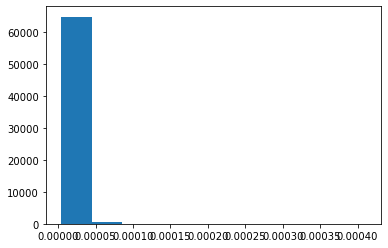

In [16]:
# Plot histogram of the prediction to find a suitable threshold.
plt.hist(out.data.cpu().numpy().flatten())

Score: 0.0004107292916160077


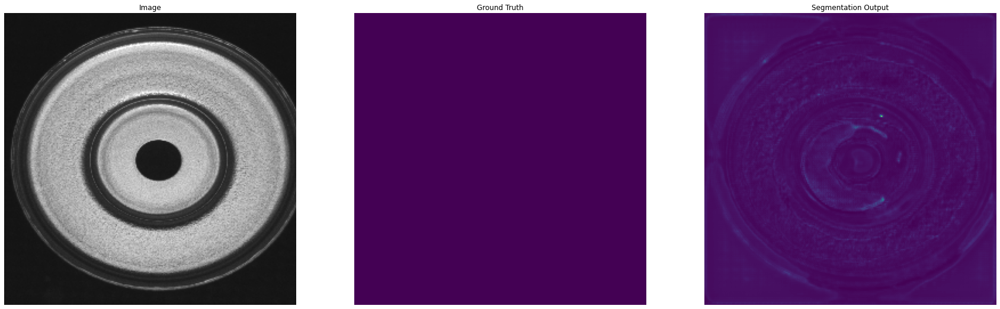

In [17]:
print(f'Score: {out.max()}')
fig, axs = plt.subplots(1, 3, figsize=(30, 10))
axs[0].imshow(img.cpu().squeeze().permute(1, 2, 0));
axs[0].set_title('Image')
axs[0].axis('off');
axs[1].imshow(mask.squeeze().cpu());
axs[1].set_title('Ground Truth')
axs[1].axis('off');
axs[2].imshow(out.cpu());
axs[2].set_title(f'Segmentation Output')
axs[2].axis('off');

#### UNSEEN IMAGE

In [18]:
img = cv2.imread(f'{test_path}\\sBAD (46).png')
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

img = preprocess(img).unsqueeze(dim=0)
if gpus > 0:
    img = img.cuda()

print(f"Input dimensions: {img.shape}")

Input dimensions: torch.Size([1, 3, 256, 256])


In [19]:
model.eval()
with torch.no_grad():
    start = time.time()
    out = model(img)
    print(f"Time: {(time.time() - start):.3f} seconds")  
    out = out.detach().squeeze() 

Time: 0.013 seconds


(array([6.5342e+04, 1.0000e+01, 6.0000e+00, 6.0000e+00, 1.0000e+01,
        6.0000e+00, 7.0000e+00, 4.0000e+00, 6.0000e+00, 1.3900e+02]),
 array([4.0942850e-06, 1.0000368e-01, 2.0000328e-01, 3.0000287e-01,
        4.0000245e-01, 5.0000203e-01, 6.0000163e-01, 7.0000124e-01,
        8.0000085e-01, 9.0000039e-01, 1.0000000e+00], dtype=float32),
 <BarContainer object of 10 artists>)

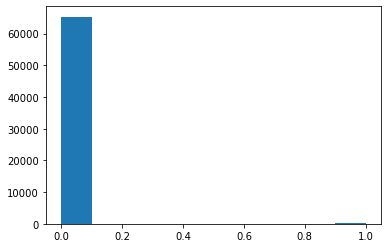

In [20]:
# Plot histogram of the prediction to find a suitable threshold.
plt.hist(out.data.cpu().numpy().flatten())

Score: 1.0


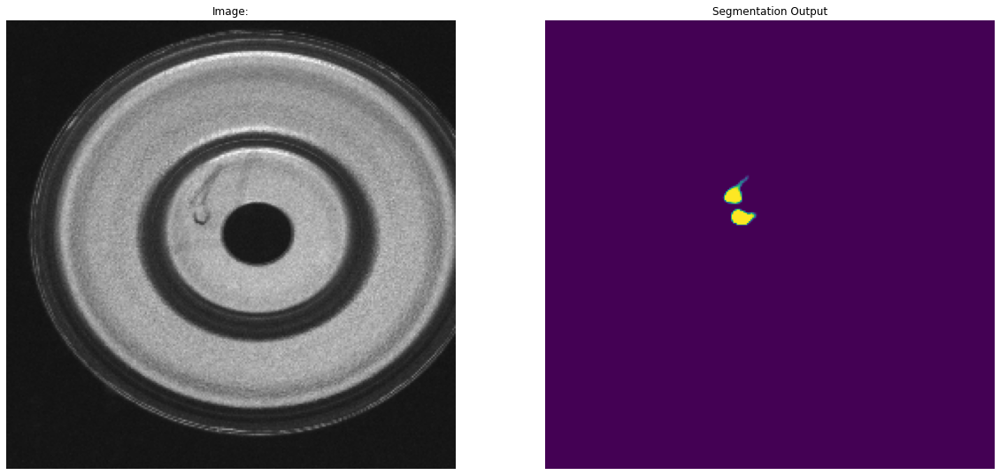

In [21]:
print(f'Score: {out.max()}')
plt.figure(figsize=(20,60));
plt.subplot(121);
plt.imshow(img.cpu().squeeze().permute(1, 2, 0));
plt.title('Image:')
plt.axis('off');
plt.subplot(122);
#plt.imshow(out > 0.455);
plt.imshow(out.cpu());
plt.title('Segmentation Output')
plt.axis('off');

## FULL TEST

In [22]:
# Set prediction threshold
model.pred_threshold = 0.9

#### Manual evaluation single element batch => validation set

Test progress: 10/10
Mean test prediction time [ms]:  12.466620445251465


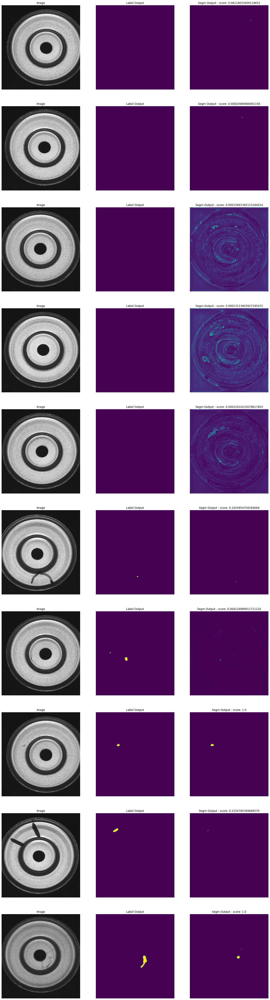

In [24]:
test_loader = CustomDataModule(batch_size=1).val_dataloader()
model.eval()

# Compute average prediction time and save results
ts_tot = list()
y_test = list()
y_hats_test = list()
accs = list()
scores_f = ['Image_label; Score\n']
scores = []
i = 1

if print_all_images:
    fig, axs = plt.subplots(test_loader.__len__(), 3, figsize=(21, 80))

for batch in test_loader:
    x, y = batch
    if gpus > 0:
        x = x.cuda()
    # Log start time
    ts_start = time.time()
    # Compute output mask from input image
    out_mask = model(x)
    # Log end time
    ts_end = time.time()
    # Compute total time in ms
    ts_tot.append((ts_end - ts_start) * 1000)
    # Save computed mask
    #save_image((out_mask > model.pred_threshold).double(), f'{results_path}\\mask_{i}.png')
    # Update progress bar
    clear_output(wait=True)
    print(f'Test progress: {i}/{datamodule.valid_data.__len__()}')
    
    if print_all_images:
        # Print images
        axs[i-1, 0].imshow(x.cpu().squeeze().permute(1, 2, 0), cmap="gray", aspect='auto');
        axs[i-1, 0].set_title(f'Image')
        axs[i-1, 0].axis('off');
        axs[i-1, 1].imshow(y.detach().squeeze().cpu(), aspect='auto');
        axs[i-1, 1].set_title(f'Label Output')
        axs[i-1, 1].axis('off');
        axs[i-1, 2].imshow(out_mask.detach().squeeze().cpu(), aspect='auto');
        axs[i-1, 2].set_title(f'Segm Output - score: {out_mask.max()}')
        axs[i-1, 2].axis('off');
    
    i = i + 1
    

# Print results
print("Mean test prediction time [ms]: ", torch.tensor(ts_tot).mean().item())


#### Manual evaluation single element batch => test set

Test progress: 55/55
Mean test accuracy:  0.581818163394928
Mean test prediction time [ms]:  14.234675407409668
Predictions:
tensor([0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0,
        1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 0,
        1, 1, 0, 0, 1, 0, 1])
Target:
tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
        1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
        1, 1, 1, 1, 1, 1, 1])


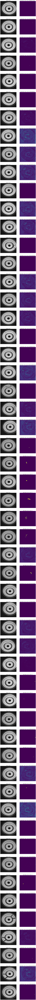

In [25]:
# Set prediction threshold
model.pred_threshold = 0.1

# Get test dataloader
test_loader = datamodule.test_dataloader()
model.eval()

# Compute average prediction time and save results
ts_tot = list()
y_test = list()
y_hats_test = list()
accs = list()
scores_f = ['Image_label; Score\n']
scores = []
i = 1

if print_all_images:
    fig, axs = plt.subplots(test_loader.__len__(), 2, figsize=(14, 400))

for batch in test_loader:
    x, y = batch
    if gpus > 0:
        x = x.cuda()
    # Log start time
    ts_start = time.time()
    # Compute output mask from input image
    out_mask = model(x)
    # Log end time
    ts_end = time.time()
    # Compute prediction from output mask
    y_hat = model.classify(out_mask)
    # Compute total time in ms
    ts_tot.append((ts_end - ts_start) * 1000)
    # Update accuracy and score
    y_hat = y_hat.cpu()
    accs.append(accuracy(y_hat.unsqueeze(dim=0), y))
    score = out_mask.max().item()
    scores_f.append(f'{y.item()}; {score}\n')
    scores.append([y.item(), score])
    # Append results
    y_hats_test.append(y_hat.item())
    y_test.append(y)
    # Save computed mask
    #save_image((out_mask > model.pred_threshold).double(), f'{results_path}\\mask_{i}.png')
    # Update progress bar
    clear_output(wait=True)
    print(f'Test progress: {i}/{datamodule.test_data.__len__()}')
    
    if print_all_images:
        # Print images
        axs[i-1, 0].imshow(x.cpu().squeeze().permute(1, 2, 0), cmap="gray", aspect='auto');
        axs[i-1, 0].set_title(f'Image - Class: {y.item()}')
        axs[i-1, 0].axis('off');
        axs[i-1, 1].imshow(out_mask.detach().squeeze().cpu(), aspect='auto');
        axs[i-1, 1].set_title(f'Segm Output - Class: {y_hat.item()}; Score: {score}')
        axs[i-1, 1].axis('off');
    
    i = i + 1
    
# Save scores file
scores_file = open(f'{results_path}\\scores.csv', 'w')
scores_file.writelines(scores_f)
scores_file.close()

# Print results
print("Mean test accuracy: ", torch.tensor(accs).mean().item())
print("Mean test prediction time [ms]: ", torch.tensor(ts_tot).mean().item())
print("Predictions:")
print(torch.tensor(y_hats_test))
print("Target:")
print(torch.tensor(y_test))


array([<AxesSubplot:title={'center':'score'}>], dtype=object)

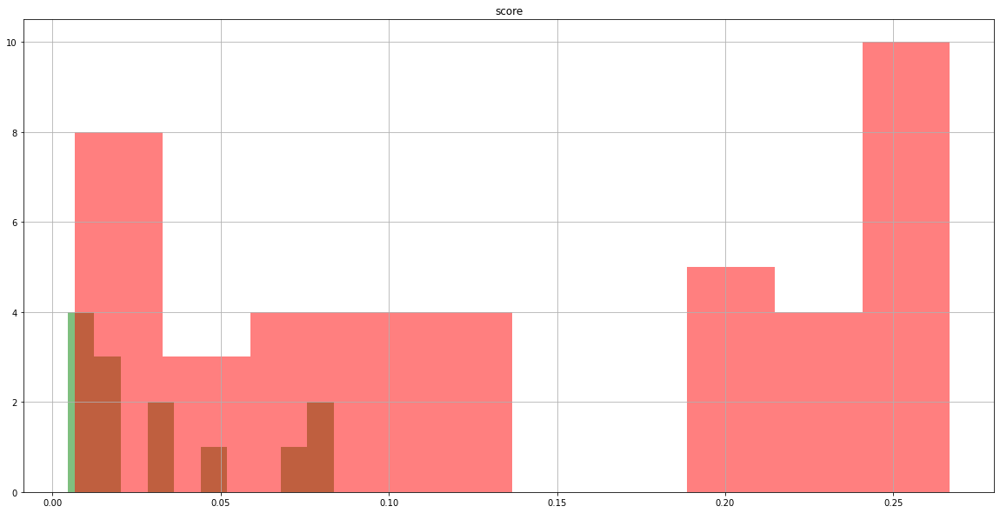

In [123]:
# Print scores histogram
scores_df = pd.DataFrame(scores, columns=['label', 'score'])
scores_df.sort_values(by=['score'])
fig = plt.figure(figsize=(20, 10))
ax1 = fig.add_subplot(111)
scores_df[scores_df['label'] == 0].hist(column = 'score', color = 'green', alpha = 0.5, ax=ax1)
scores_df[scores_df['label'] == 1].hist(column = 'score', color = 'red', alpha = 0.5, ax=ax1)

## TRAINING LOGS

In [31]:
%load_ext tensorboard

In [32]:
%tensorboard --logdir tb_logs/
# If fails to open (localhost refused to connect) launch these commands in cmd prompt:
#taskkill /im tensorboard.exe /f
#del /q %TMP%\.tensorboard-info\*

Reusing TensorBoard on port 6006 (pid 7728), started 15:24:28 ago. (Use '!kill 7728' to kill it.)

## SAVE THE MODEL

### JIT SAVING

In [96]:
# Convert pytorch model into script model
traced_script_model = torch.jit.trace(model, x)
#script_model = torch.jit.script(model)

C:\Users\Alessandro.Bonvini\Anaconda3\envs\PyTorchvEnv\lib\site-packages\torch\_tensor.py:575: UserWarning: floor_divide is deprecated, and will be removed in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values.
To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor'). (Triggered internally at  ..\aten\src\ATen\native\BinaryOps.cpp:467.)
  return torch.floor_divide(self, other)


In [118]:
# Test script model prediction
traced_script_model.eval()
out_mask_script = model.activ_fn_out(traced_script_model(img))

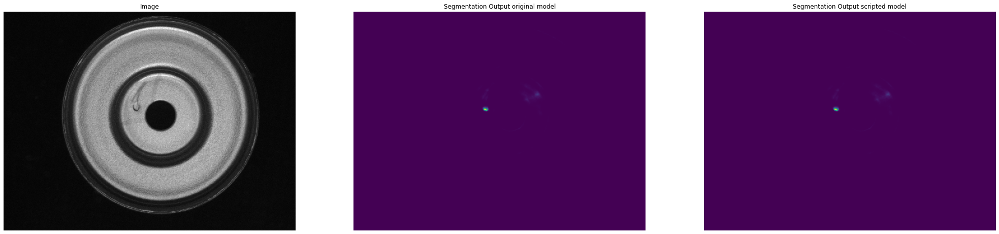

In [119]:
fig, axs = plt.subplots(1, 3, figsize=(35, 10))
axs[0].imshow(img.cpu().squeeze(), cmap="gray");
axs[0].set_title(f'Image')
axs[0].axis('off');
axs[1].imshow(out.detach().squeeze().cpu());
axs[1].set_title(f'Segmentation Output original model')
axs[1].axis('off');
axs[2].imshow(out_mask_script.detach().squeeze().cpu());
axs[2].set_title(f'Segmentation Output scripted model')
axs[2].axis('off');

In [100]:
# Save script model using jit
torch.jit.save(traced_script_model, 'pt_models\\SNDE_UNet_cpu_traced.pt')

### ONNX SAVING

In [126]:
torch.onnx.export(model, x, "onnx_models\\SNDE_UNet_cpu_traced.onnx", opset_version=11)